# import libraries

In [114]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
import os
%matplotlib inline

## Show images 

A helper function used to show images 

In [19]:
def show_images(images , cols=2 , figure_save=False):
    '''
    A function that takes a list of images then divied the figure into rows and columns and
    show the images in subplots manner .
    
    parameters :
    cols  - number of columns 
    
    returns :
    nothing
    '''
    rows = np.ceil(len(images)/cols)
    
    f = plt.figure( figsize = (10,len(images)*2))
    
    for i,image in enumerate(images) :
                
        if   len(image.shape) == 2 :      # if it's a gray scale image
            cmap = 'gray'
        elif len(image.shape) == 3 :      # if it's a RGB image
            cmap = None
            
        plt.subplot(rows , cols , i+1)
        plt.imshow(image , cmap = cmap)
        plt.xticks([])
        plt.yticks([])
    
    if figure_save==True :
        
        f.savefig('output.png')

    plt.tight_layout()
    plt.subplots_adjust( hspace = 0.1 , wspace = 0.1)
    plt.show()

## Read test images and store them in `test_images` list

In [20]:
test_images = [ mpimg.imread(image_path) for image_path in glob.glob('test_images/*.jpg') ]

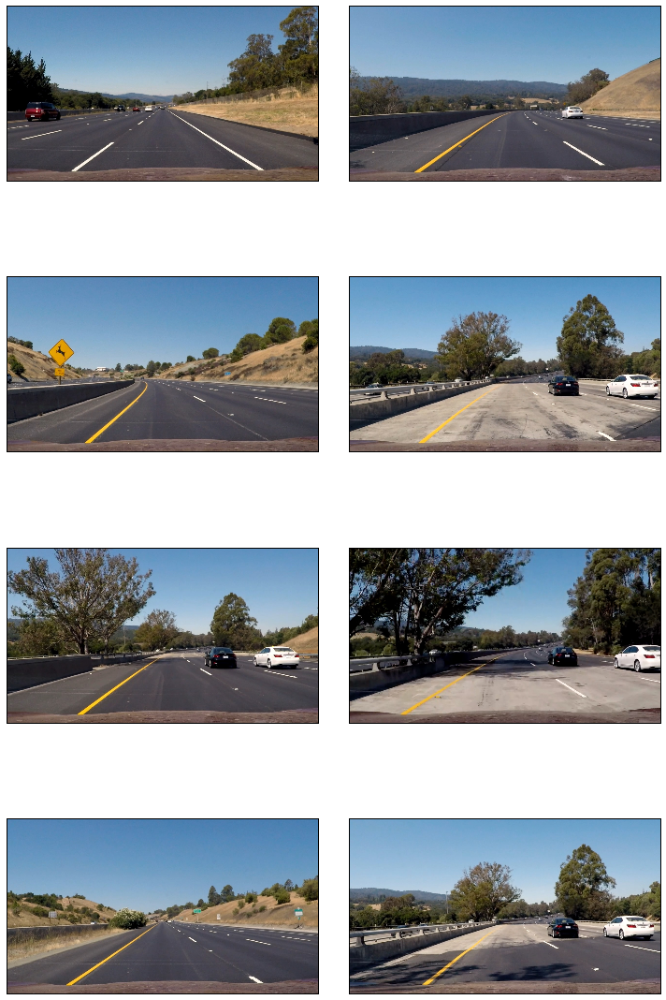

In [21]:
show_images(test_images)

# 1 . Camera calibration

In [22]:
# read chess board images used for calibration of camera as RGB images and put them in a list
camera_calibration_images = [ mpimg.imread(image_path) for image_path in glob.glob('camera_cal/*.jpg') ]

- ## Finding corners in  chess board image 

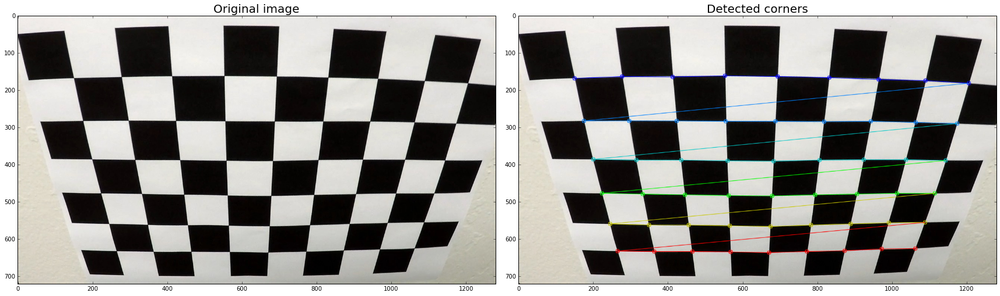

In [23]:
# read an image

chessBoard_image = camera_calibration_images[6]

# convert it to grayscale image

gray = cv2.cvtColor(chessBoard_image, cv2.COLOR_RGB2GRAY)

# Find the chess board corners

nx = 9   #number of inside corners in x dimesnion
ny = 6   #number of inside corners in y dimesnion

ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

# if corners are found ,  draw and display them  
if ret == True :
    
    corners_image = np.copy(chessBoard_image)
    cv2.drawChessboardCorners( corners_image , (nx,ny) , corners , ret)

    f , (ax1 , ax2 ) = plt.subplots( 1 , 2 , figsize=(24,9) )
    f.tight_layout()
    ax1.imshow(chessBoard_image)
    ax1.set_title('Original image' , fontsize=20)
    ax2.imshow(corners_image)
    ax2.set_title('Detected corners' , fontsize=20)
    f.savefig('output_images/finding_corners/chessBoard_corners.png' )

- ## Extract object points and image points

Object points are 3D points in read world space while image points are  2D points in image plane .  
Both of them are required by opencv to calibrate the camera and calculate the camira matrix and distortion coefficients.

In [24]:
def calibrate_camera(chessboard_images , pattern) :
    '''
    A function used to calibrate the camera by iterating through chess board images
    
    parameters :
    
    chessboard_images  -> list of chess board images
    pattern            -> tuple of number of corners in x , y dimesnions
    
    returns :
    
    mtx     -> camera matrix
    dist    -> distortion coefficients
    
    '''
    
    nx = pattern[0]  # number of inside corners in x
    ny = pattern[1]  # number of inside corners in y
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)

    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.


    # Step through the list and search for chessboard corners

    for idx, img in enumerate(camera_calibration_images):
    
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
        
    # perform camera calibration
    ret , mtx , dist , rvecs , tvecs = cv2.calibrateCamera(objpoints , imgpoints , gray.shape[::-1] ,None , None)
    
    return  mtx , dist

In [25]:
mtx , dist = calibrate_camera(camera_calibration_images , (9 , 6) )

- ### Pickle it so that it can be used for future uses !

In [26]:
camera_data = {"camera_matrix" : mtx , "distortion_coefficients" : dist}
outfile = open('camera_calibration' , 'wb')
pickle.dump( camera_data , outfile )
outfile.close()

**camera matrix** and **distortion coefficients** resulted from camera calibration are now stored in *camera_calibration* file in the project repository

# 2 . Correction for distortion

In [27]:
def undistort_image(img, mtx , dist):
    '''
    A function that corrects for distortions such tangential distortion and radial distortion in images
    
    parameters :
    
    img  -> original image  
    mtx  -> camera matrix 
    dist -> distortion coefficients
    
    returns :
    
    undist -> undistorted image
    
    '''
    
    undist = np.copy(img) 
    undist = cv2.undistort(img , mtx , dist , None , mtx )
    
    return undist

- ### select a chessboard image and undistort it 

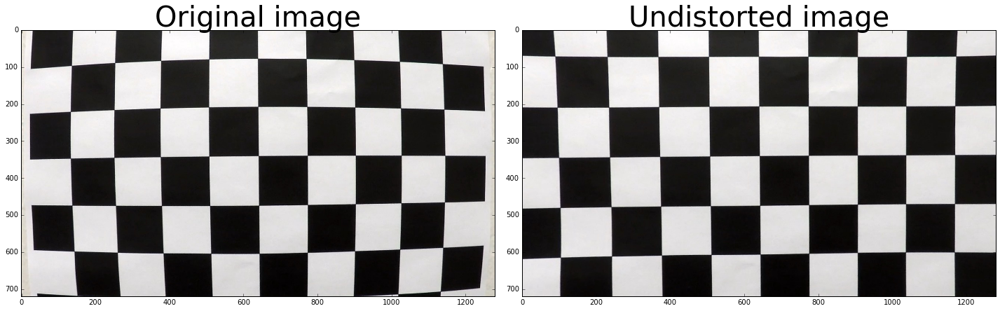

In [28]:
original = camera_calibration_images[0]
undistorted = undistort_image(original , mtx , dist)

f , (ax1 , ax2 ) = plt.subplots(1 , 2 , figsize=(20,9))
f.tight_layout()
ax1.imshow(original)
ax1.set_title('Original image' , fontsize=40)
ax2.imshow(undistorted)
ax2.set_title('Undistorted image' , fontsize=40)
f.savefig('output_images/undistorted_images/chess_board.png')

- ## Correct for distorion in test images

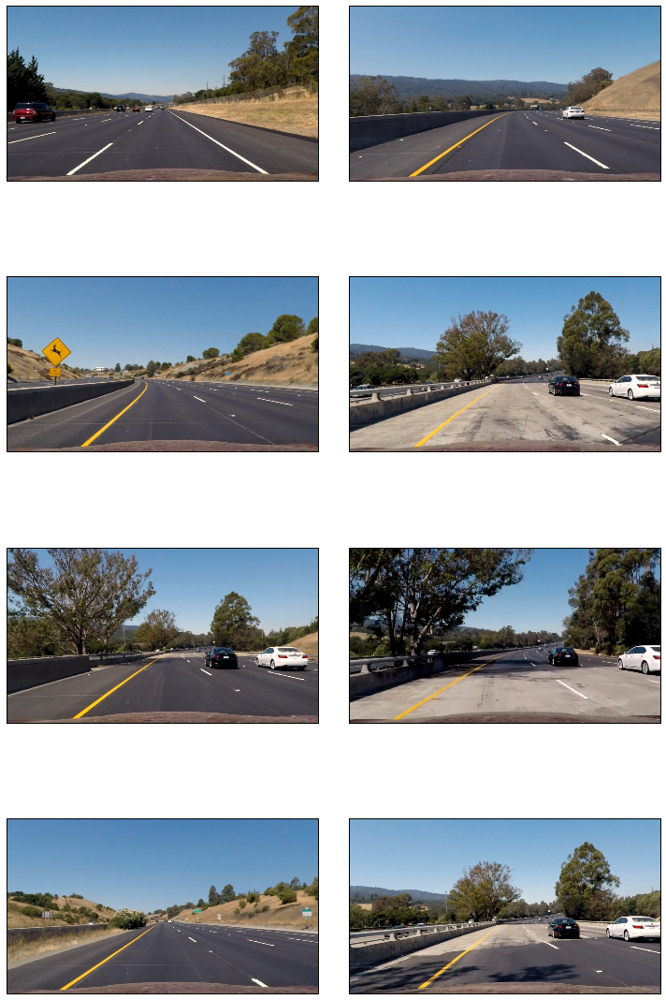

In [29]:
undist_test_images = list(map(lambda x : undistort_image(x , mtx , dist) , test_images))
show_images(undist_test_images , figure_save=True)

# save the undistorted images in output_images/undistorted_images directory

for i , image in enumerate(undist_test_images) :
    #image = cv2.cvtColor( image , cv2.COLOR_RGB2BGR )
    plt.imsave('output_images/undistorted_images/'+str(i+1)+'.png', image )

# 3 . Perspective transform 

Perspective transform is performed by finding the mapping from 2D image points called the source points to another set of 2D image points called the destination points in order to warp the images to obtain a bird's eye view  

In [72]:
def perspective_transform(image) :
    '''
    A function that accepts undistorted image and warps it to get Bird's eye-view
    using the source points and destination points hardcoded in it 
    
    Parameters :
    
    image  -> undistorted RGB image
    
    Returns :
    
    warped -> warped RGB image 
    
    '''
    # get the height and the width of the image
    
    h ,  w = image.shape[:2]
    
    # set the source points 
    
    src_bottom_left = (0.5*w - 430 , h - 1)
    src_top_left    = (0.5*w - 90  , 0.5*h + 120)
    src_top_right   = (0.5*w + 90  , 0.5*h + 120)
    src_bottom_right= (0.5*w + 470 , h - 1)
    
    src_pts = np.array([src_bottom_left,src_top_left,src_top_right,src_bottom_right] , np.float32)

    # set the destination points 
    
    dst_bottom_left = (0.5*w - 300 , h - 1)
    dst_top_left    = (0.5*w - 300 , 1)
    dst_top_right   = (0.5*w + 300 , 1)
    dst_bottom_right= (0.5*w + 300 , h - 1)
    

    dst_pts = np.array([dst_bottom_left,dst_top_left,dst_top_right,dst_bottom_right] , np.float32)


    # Given source points and destination points calculate the transformation matrix M
    
    M = cv2.getPerspectiveTransform(src_pts, dst_pts)
    
    # Warp the image
    
    warped = cv2.warpPerspective(image , M , (w,h) )
    
    return warped 

- ## Draw the source points and the destination points

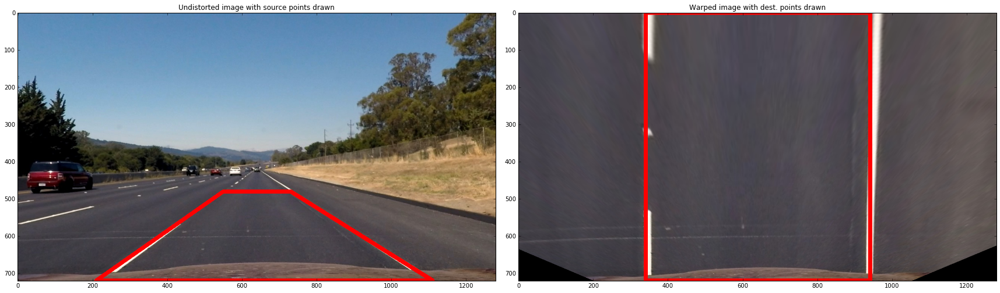

In [31]:
# select an undistorted image 

image = undist_test_images[0]

# get the height and the width of the image

h ,  w = image.shape[:2]

src_bottom_left = (0.5*w - 430 , h - 1)
src_top_left    = (0.5*w - 90  , 0.5*h + 120)
src_top_right   = (0.5*w + 90  , 0.5*h + 120)
src_bottom_right= (0.5*w + 470 , h - 1)

src_pts = np.array([src_bottom_left,src_top_left,src_top_right,src_bottom_right] , np.int32)

dst_bottom_left = (0.5*w - 300 , h - 1)
dst_top_left    = (0.5*w - 300 , 1)
dst_top_right   = (0.5*w + 300 , 1)
dst_bottom_right= (0.5*w + 300 , h - 1)

dst_pts = np.array([dst_bottom_left,dst_top_left,dst_top_right,dst_bottom_right] , np.int32)

# recast src_pts and dst_pts in usable format for cv2.polylines()

src_pts = src_pts.reshape((-1,1,2))
dst_pts = dst_pts.reshape((-1,1,2))


img = np.copy(image)
warped_img  = perspective_transform(img)

# draw the polygons defined by the source points and the destination points 

cv2.polylines(img , [src_pts] , True , (255, 0 ,0), thickness=10)
cv2.polylines(warped_img , [dst_pts] , True , (255,0,0), thickness=10)


f , (ax1,ax2) = plt.subplots(1,2 ,figsize=(24,9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Undistorted image with source points drawn')
ax2.imshow(warped_img)
ax2.set_title('Warped image with dest. points drawn')

# save the result 

f.savefig('output_images/warped_images/source_and_destination.png')

- ## Test it on test images

		Original image					Warped image


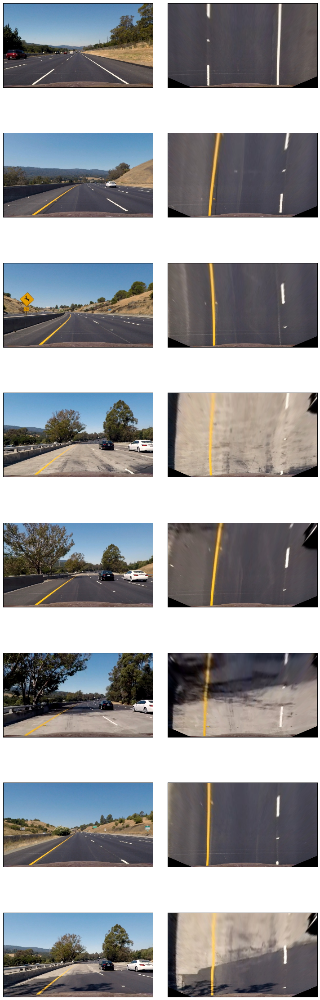

In [32]:
warped_images = list(map(perspective_transform , undist_test_images))

l = list(zip(undist_test_images,warped_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\t\tWarped image')

show_images(combined , figure_save=True)

# save the warped images in output_images/warped_images directory

for i , image in enumerate(warped_images) :
    
    #image = cv2.cvtColor( image , cv2.COLOR_RGB2BGR )
    
    plt.imsave('output_images/warped_images/'+str(i+1)+'.png', image )


## 4 . Image thresholding 

Image thresholding incorporates color transforms, gradients, etc., to create a thresholded binary image.

- ### Exploring color spaces

Different color spaces are investigated to choose the one achieveing the best results in isolating lane lines under varying lighting conditions

but first let's define a helper function 

In [33]:
def color_space(image , space='RGB') :
    '''
    A function that accepts an image and displays its individual channels of the given color space 
    in grayscale
    
    Parameters :
    image  -> original RGB image
    space  -> selected color space to display its individual channels
    
    Returns :
    nothing
    
    '''
    
    # split the channels 
    
    if space == 'RGB':
        channel1 = image[:,:,0]
        channel2 = image[:,:,1]
        channel3 = image[:,:,2]
    elif space == 'HLS' :
        hls = cv2.cvtColor( image , cv2.COLOR_RGB2HLS)
        channel1 = hls[:,:,0]
        channel2 = hls[:,:,1]
        channel3 = hls[:,:,2]
    elif space == 'LAB' :
        lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
        channel1 = lab[:,:,0]
        channel2 = lab[:,:,1]
        channel3 = lab[:,:,2]
    
    # display the image in addition to the individual channels of the selected color space
    
    f , ((ax1,ax2) , (ax3,ax4)) = plt.subplots(2 , 2 , figsize=(18,10))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original' , fontsize=20)
    ax2.imshow(channel1 , cmap='gray')
    ax2.set_title(space+' '+space[0]+'-channel' , fontsize=20)
    ax3.imshow(channel2 , cmap='gray')
    ax3.set_title(space+' '+space[1]+'-channel' , fontsize=20)
    ax4.imshow(channel3 , cmap='gray')
    ax4.set_title(space+' '+space[2]+'-channel' , fontsize=20)
    plt.subplots_adjust(hspace = 0.2)

In [34]:
# select a warped image
image = warped_images[0]

### I . RGB color space :

Let's display the  Red , Green , Blue channels of the RGB color space 

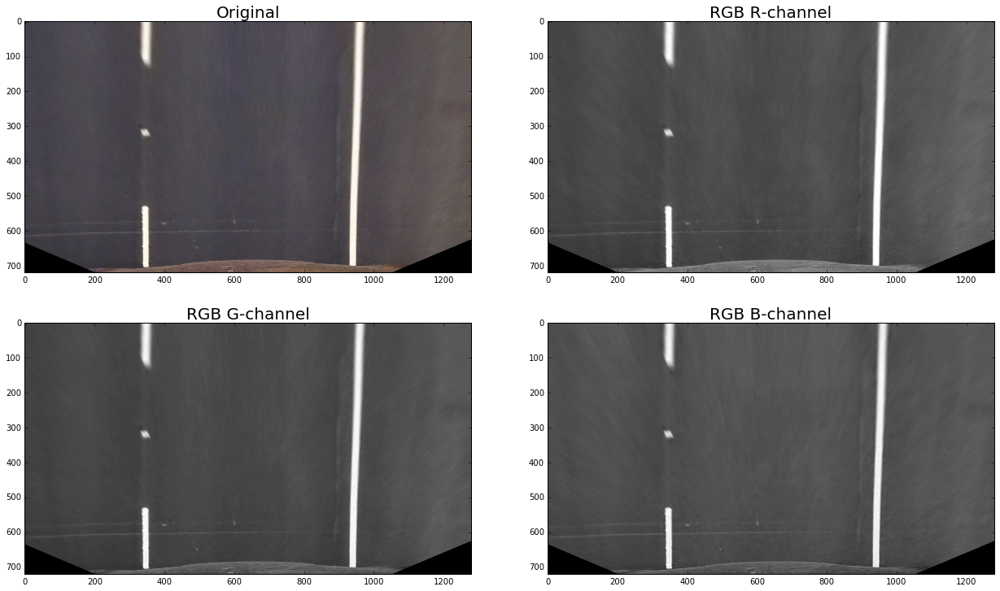

In [35]:
color_space(image , 'RGB')

### II. HLS color space

Let's display the Hue , Lightness , Saturation channels of the HLS color space

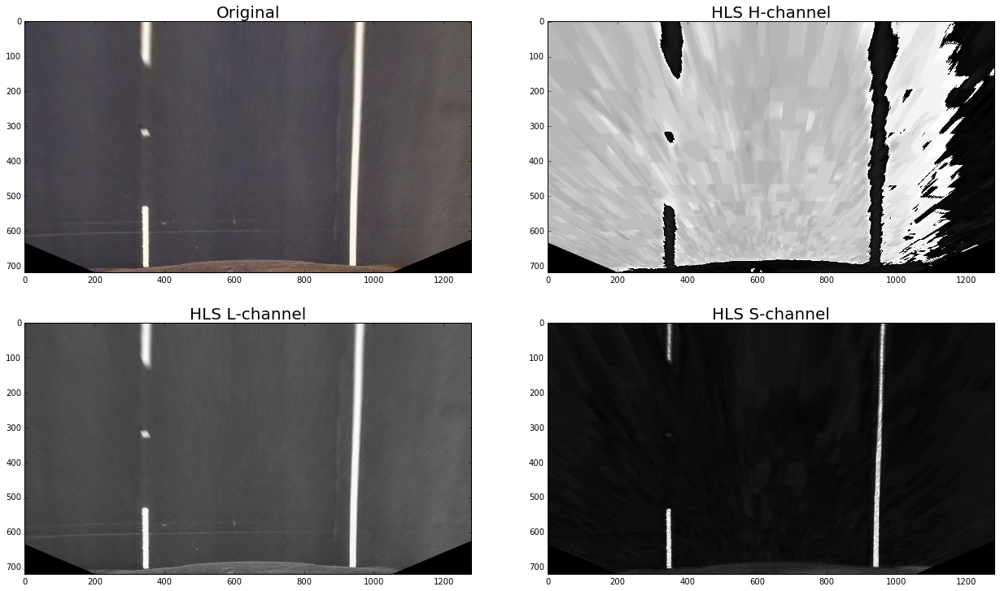

In [36]:
color_space(image , 'HLS')

### III. LAB color space

Let's display the lightness , green–red (a) , blue–yellow (b) channels of the LAB color space . 

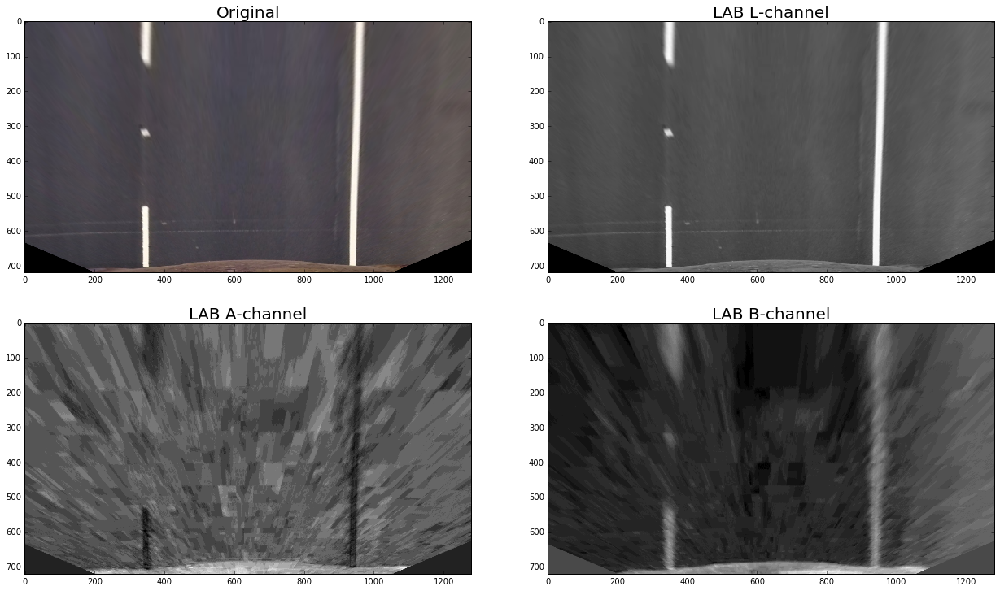

In [37]:
color_space( image , 'LAB')

LAB and HSL color spaces are doing fairly better than other color spaces under varying lighting conditions

## ( Color thresholding )

   **Color thresholding** : effect of using B channel alone of LAB color color space .  

In [38]:
def color_threshold_b( image ,  b_thresh=(150,255) ) :
    '''
    A function that returns a binary image where the pixels whose values meet
    a specific condition take a value of one , otherwise zero
    
    Parameters :
    
    image    -> RGB image
    b_thresh -> a tuple that holds the low threshold and the high threshold of the B channel
    
    Returns :
    
    binary   -> binary image whose values are either 1s or 0s
    '''
    # convert to LAB color space
    
    lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
    b_channel = lab[:,:,2]
    
    # thresholding
    
    low_thresh , high_thresh = b_thresh
    binary = np.zeros(image.shape[:2])
    binary[ (b_channel > low_thresh) & (b_channel <= high_thresh) ] = 1
    
    return binary

		Original image				Color thresholded image


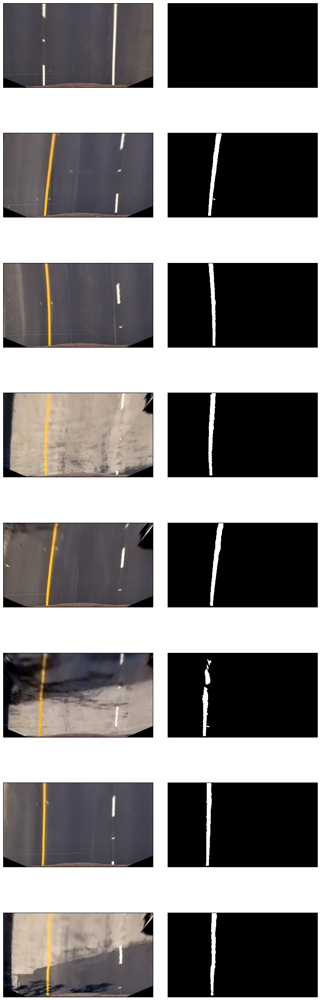

In [39]:
# apply color_threshold_b to warped_images and store the results in a list

color_thresholded_images = list(map( color_threshold_b , warped_images))

# prepare the images for plotting

l = list(zip(warped_images, color_thresholded_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tColor thresholded image')
show_images(combined , figure_save=True)

# save the resulted binary images in output_images/binary_images/b_threshold  directory

for i , image in enumerate(color_thresholded_images) :
    
    
    plt.imsave('output_images/binary_images/b_threshold/'+str(i+1)+'.png', np.dstack((image,image,image)) )

### **conclusion** :
It does a good job in isolating Yellow lane lines under varying lighting conditions .

**color thresholding** : effect of using L channel alone of LAB color space

In [40]:
def color_threshold_l( image , l_thresh=(220,255) ) :
    '''
    A function that returns a binary image where the pixels whose values meet
    a specific condition take a value of one , otherwise zero
    
    Parameters :
    
    image    -> RGB image
    l_thresh -> a tuple that holds the low threshold and the high threshold of the L channel
    
    Returns :
    
    binary   -> binary image whose values are either 1s or 0s
    '''
    # convert to LAB color space
    
    lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
    l_channel = lab[:,:,0]
    
    # thresholding
    
    binary = np.zeros(image.shape[:2])
    binary[( l_channel > l_thresh[0] ) & ( l_channel <= l_thresh[1] ) ] = 1
    
    return binary

		Original image				Color thresholded image


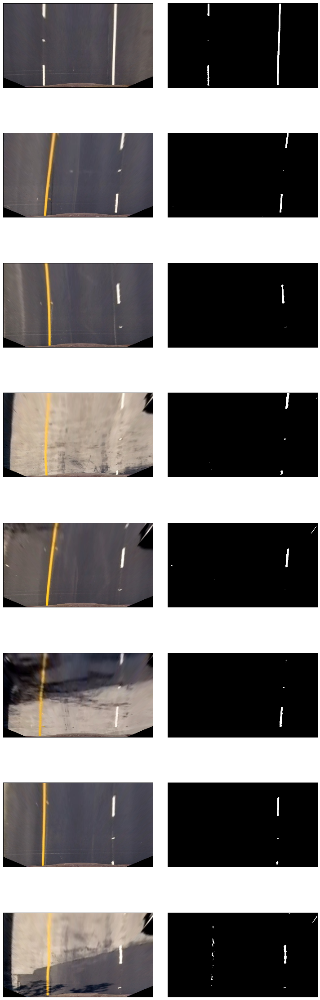

In [41]:
# apply color_threshold_b to warped_images and store the results in a list

color_thresholded_images = list(map( color_threshold_l , warped_images))

# prepare the images for plotting

l = list(zip(warped_images, color_thresholded_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tColor thresholded image')
show_images(combined , figure_save=True)

# save the resulted binary images in output_images/binary_images/l_threshold  directory

for i , image in enumerate(color_thresholded_images) :
    
    
    plt.imsave('output_images/binary_images/l_threshold/'+str(i+1)+'.png', np.dstack((image,image,image)) )

### Conclusion :
It does a good job in isolating White lane lines  under varying lighting conditions .

# Color thresholding in L and B channels :

Let's combine color thresholding in both L and B channels of LAB color space for warped image .

In [42]:
def color_threshold( image , l_thresh=(220,255) , b_thresh=(150,255)) :
    '''
    A function that returns a binary image where the pixels whose values meet
    a specific condition take a value of one , otherwise zero
    
    Parameters :
    
    image    -> RGB image
    l_thresh -> a tuple that holds the low threshold and the high threshold of the L channel
    b_thresh -> a tuple that holds the low threshold and the high threshold of the B channel
    
    Returns :
    
    binary   -> binary image whose values are either 1s or 0s
    '''
    # convert to LAB color space
    
    lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    
    # Thresholding
    
    binary = np.zeros(image.shape[:2])
    binary[((l_channel>l_thresh[0]) & (l_channel<=l_thresh[1])) | ((b_channel>b_thresh[0]) & (b_channel<=b_thresh[1]))] =1
    
    return binary

		Original image				Color thresholded image


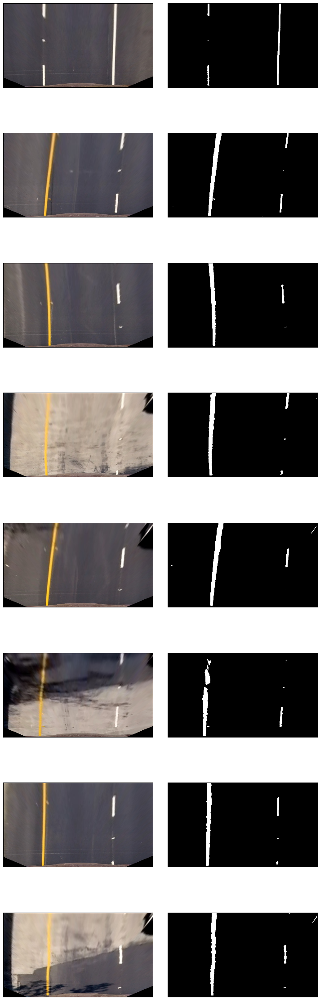

In [43]:
# apply color_threshold_b to warped_images and store the results in a list

color_thresholded_images = list(map( color_threshold , warped_images))

# preparing the images for plotting

l = list(zip(warped_images, color_thresholded_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tColor thresholded image')
show_images(combined , figure_save=True)

# save the resulted binary images in output_images/binary_images/combined  directory

for i , image in enumerate(color_thresholded_images) :
    
    
    plt.imsave('output_images/binary_images/combined/'+str(i+1)+'.png', np.dstack((image,image,image)) )

## Conclusion :
Color thresholding in both L and B channels of LAB color spaces has shown good results in isolating white and yellow lane lines .

# ( Gradient thresholding )

 Gradient thresholding is obtained by applying sobel operator to get the gradient of the image in X- direction 

In [44]:
def gradient_threshold(img , channel = 'S' , gradx_thresh=(50,150) , sobel_kernel=5  ) :
    
    if channel == 'S' :
        # obtain the hls color space
        hls = cv2.cvtColor( img , cv2.COLOR_RGB2HLS)
        selected_channel = hls[:,:,2]           # saturation channel
    
    else :
        selected_channel = cv2.cvtColor( img , cv2.COLOR_RGB2GRAY)

    
    # obtain the gradient in x direction
    
    gx = cv2.Sobel( selected_channel , cv2.CV_64F , 1 , 0 , ksize=sobel_kernel)
    
    
    # scale the gradient in x direction and convert it to 8_bit image
    
    abs_gx = np.absolute(gx)
    gradx = np.int8(255*abs_gx/np.max(abs_gx))

    # unpack the low threshold and the high threshold 
    
    low_thresh , high_thresh = gradx_thresh
    
    # thresholding
    
    binary = np.zeros(img.shape[:2])
    
    binary[ (gradx > low_thresh) & ( gradx <= high_thresh) ] = 1
    
    return binary


### 1. Sobel operator is applied to the saturation channel 

		Original image			gradient thresholded image in S channel


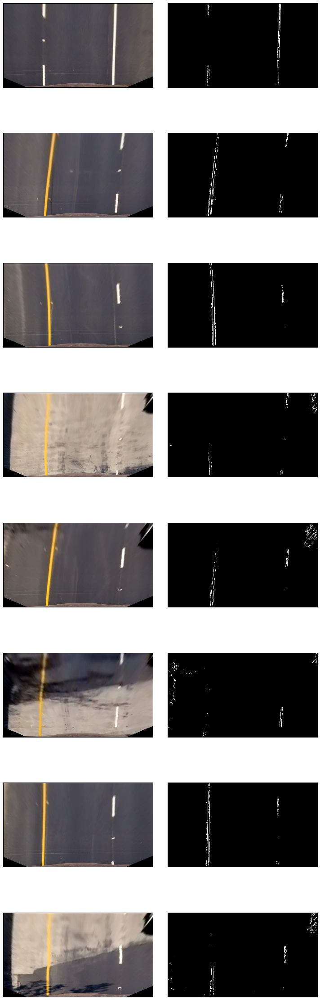

In [45]:
# apply gradient_threshold() function to warped_images and store the results in a list 

gradient_thresholded_images_S = list(map(lambda x :gradient_threshold(x,'S') , warped_images))

# prepare the images for plotting

l = list(zip(warped_images, gradient_thresholded_images_S))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\tgradient thresholded image in S channel')
show_images(combined , figure_save=True)

# save the resulted binary images in output_images/binary_images/gradient_saturation

for i , image in enumerate(gradient_thresholded_images_S) :
    
    
    plt.imsave('output_images/binary_images/gradient_saturation/'+str(i+1)+'.png', np.dstack((image,image,image)) )

### 2. Sobel operator is applied to the Grayscale image 

		Original image			gradient thresholded image in Grayscale


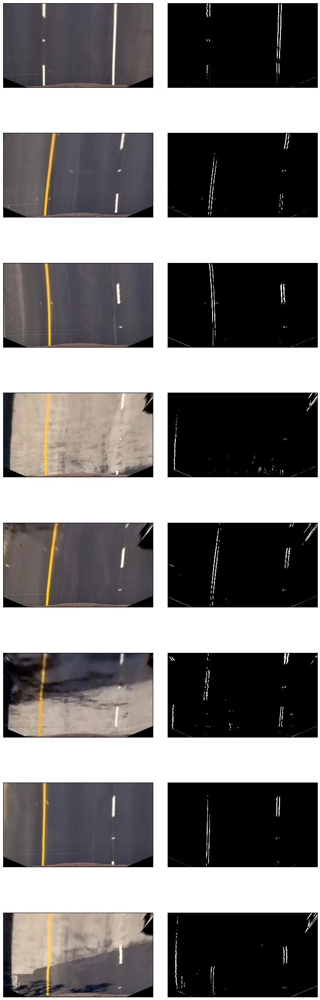

In [46]:
# apply gradient_threshold() function to warped_images and store the results in a list 

gradient_thresholded_images_G = list(map(lambda x :gradient_threshold(x,'G') , warped_images))

# prepare the images for plotting

l = list(zip(warped_images, gradient_thresholded_images_G))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\tgradient thresholded image in Grayscale')
show_images(combined , figure_save=True)

# save the resulted binary images in output_images/binary_images/gradient_grayscale

for i , image in enumerate(gradient_thresholded_images_G) :
    
    
    plt.imsave('output_images/binary_images/gradient_grayscale/'+str(i+1)+'.png', np.dstack((image,image,image)) )

## Let's compare the results

	Original image		G.thresholding in Grayscale	G.thresholding in Saturation


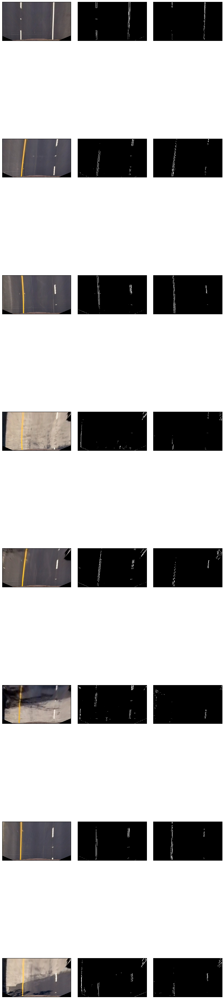

In [47]:
l = list(zip(warped_images, gradient_thresholded_images_G , gradient_thresholded_images_S))
combined = [image for sublist in l for image in sublist ]
print('\tOriginal image\t\tG.thresholding in Grayscale\tG.thresholding in Saturation')
show_images(combined , 3)

**Conclusion**:

Applying gradient thresholding to the saturation channel has given better results than the grayscale image

# Let's put it all together 

Visulaize the contribution of each thresholding method , **color** , **gradient** respectively , in *Green* and *Blue*

In [48]:
def visualize_thresholds(img) :
    color_binary = color_threshold(img)
    gradient_binary = gradient_threshold(img)
    binary = np.zeros(img.shape[:2])
    
    colored_img = np.dstack( (binary , color_binary , gradient_binary))
    
    return colored_img

		Original image				Colored thresholds


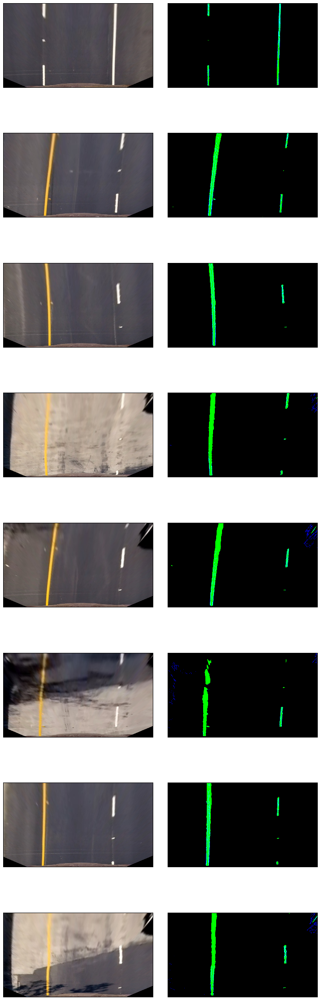

In [49]:
colored_thresholds = list(map(visualize_thresholds , warped_images))
l = list(zip(warped_images, colored_thresholds))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tColored thresholds')
show_images(combined)


# Conclusion :

By looking at the above images , We can see that color thresholding is doing fairly good and gradient thresholding doesn't add that much value besides adding some noise to the binary image .
So, I'm going to choose color thresholding as the image thresholding technique to be used in detecting lane lines
**Here is the function** :

In [50]:
def image_threshold( image , l_thresh=(220,255) , b_thresh=(150,255)) :
    
    lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
    l_channel = lab[:,:,0]
    b_channel = lab[:,:,2]
    
    binary = np.zeros(image.shape[:2])
    binary[((l_channel>l_thresh[0]) & (l_channel<=l_thresh[1])) | ((b_channel>b_thresh[0]) & (b_channel<=b_thresh[1]))] =1
    
    return binary

# ( Sliding windows ) :

In [51]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low   = leftx_current  - margin  # Update this
        win_xleft_high  = leftx_current  + margin  # Update this
        win_xright_low  = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # uncomment this to draw sliding windows on Test images
        
        #Draw the windows on the visualization image
        cv2.rectangle( out_img , (win_xleft_low,win_y_low)  , (win_xleft_high,win_y_high)  , (0,255,0) , 2) 
        cv2.rectangle( out_img , (win_xright_low,win_y_low) , (win_xright_high,win_y_high) , (0,255,0) , 2) 
        
        #Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty


## Identification of right and left lane pixels :

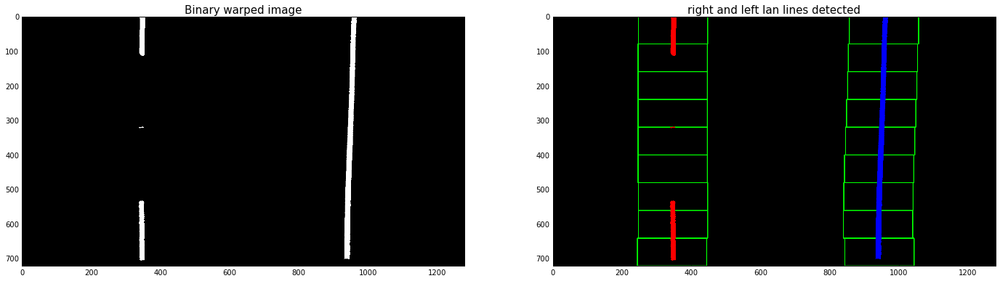

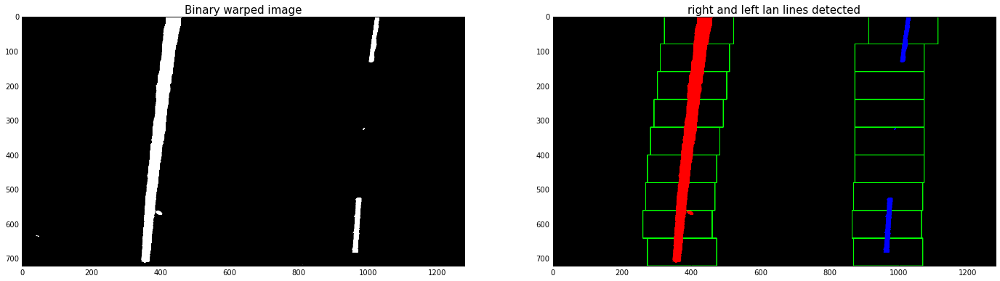

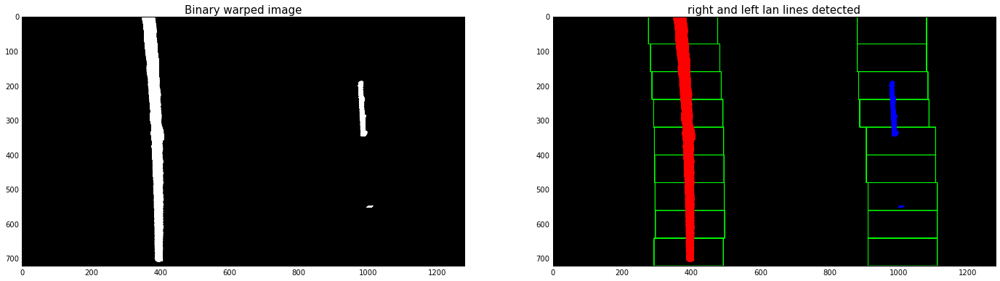

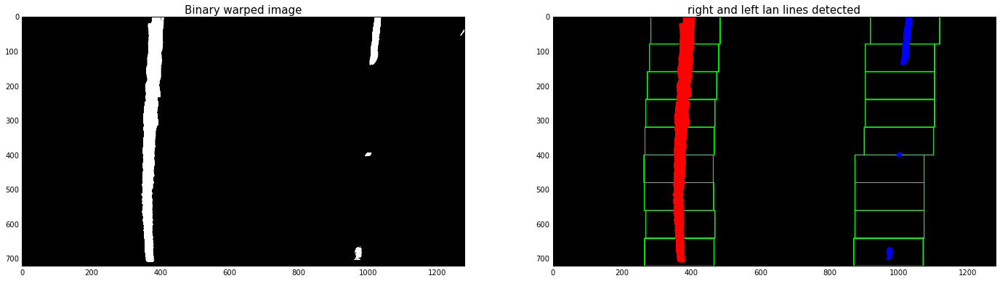

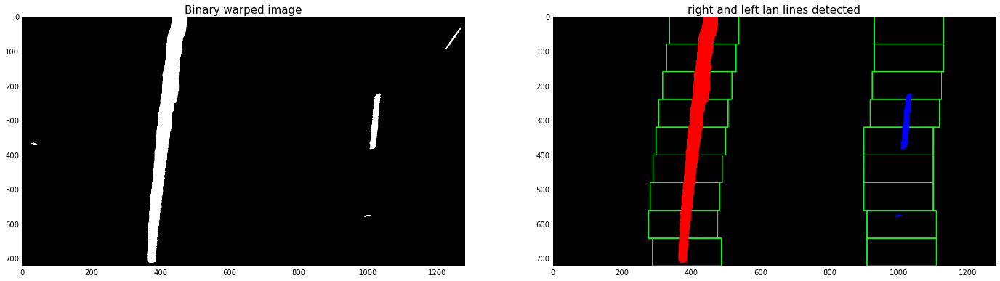

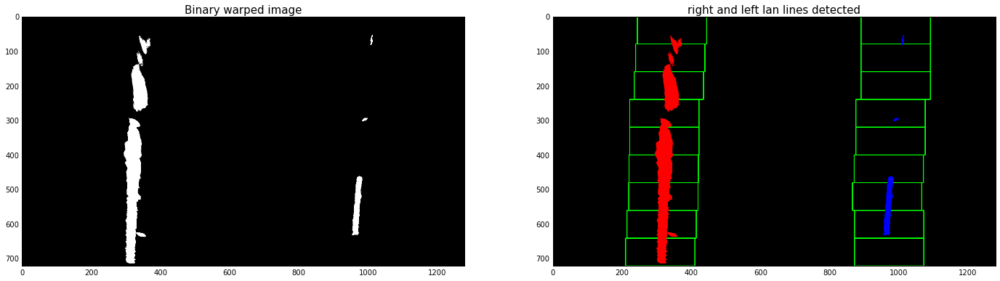

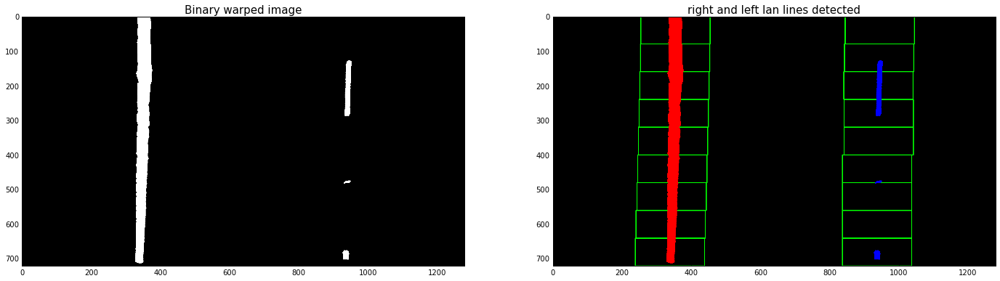

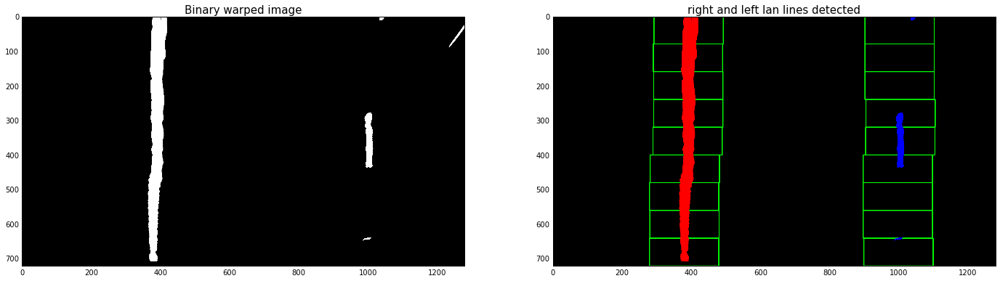

In [57]:
binary_warped = color_thresholded_images

for i , image in enumerate(binary_warped) :
    out_img = np.zeros_like(warped_img)
    leftx, lefty, rightx, righty = find_lane_pixels(image)
    
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    f , (ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(image ,  cmap='gray')
    ax1.set_title('Binary warped image' , fontsize=15)
    ax2.imshow(out_img)
    ax2.set_title('right and left lan lines detected' , fontsize=15)
    f.savefig('output_images/sliding_windows/'+str(i+1)+'.png')

# Fitting 2nd order polynomials and drawing them :

In [66]:
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)

    ###  Fit a second order polynomial to each using `np.polyfit` ###
    left_fit  = np.polyfit( lefty , leftx , 2 )
    right_fit = np.polyfit( righty , rightx , 2 )

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
    
    return left_fitx , right_fitx , ploty , leftx, lefty, rightx, righty 

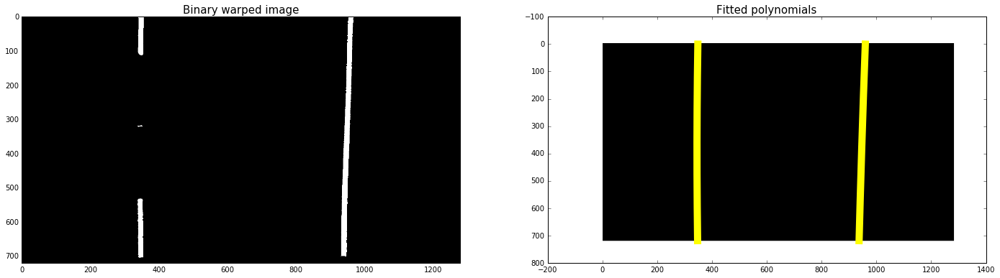

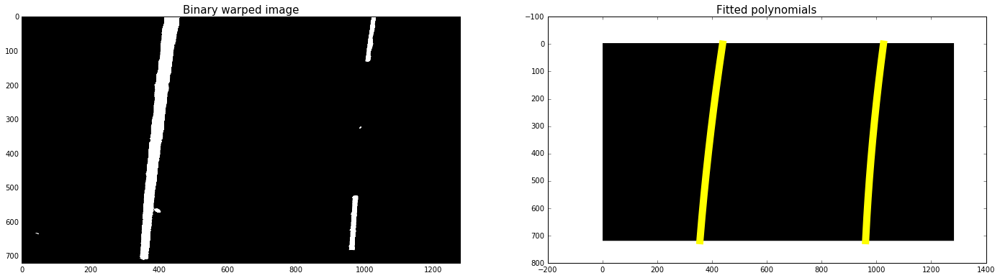

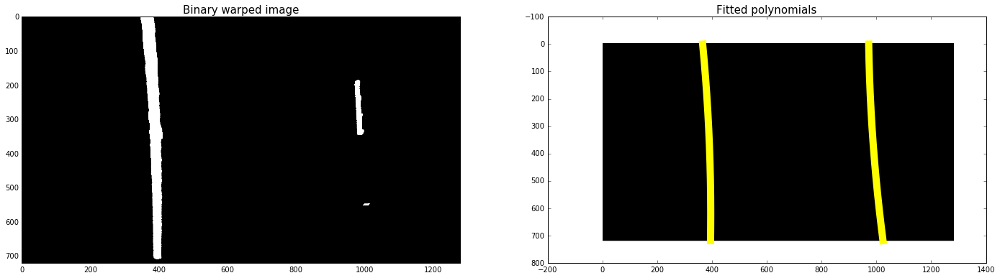

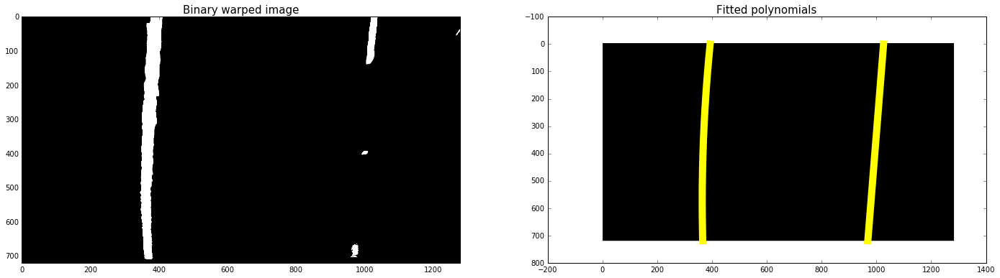

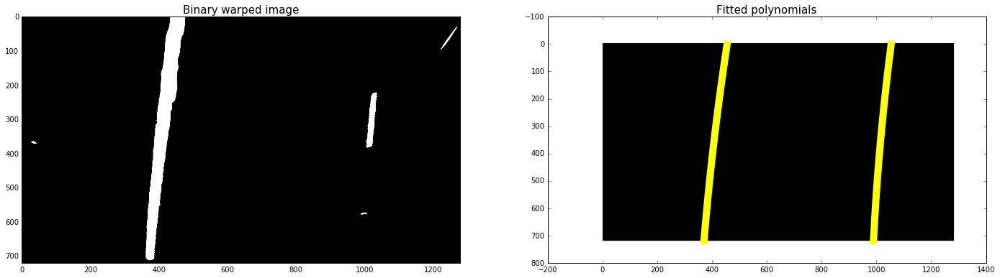

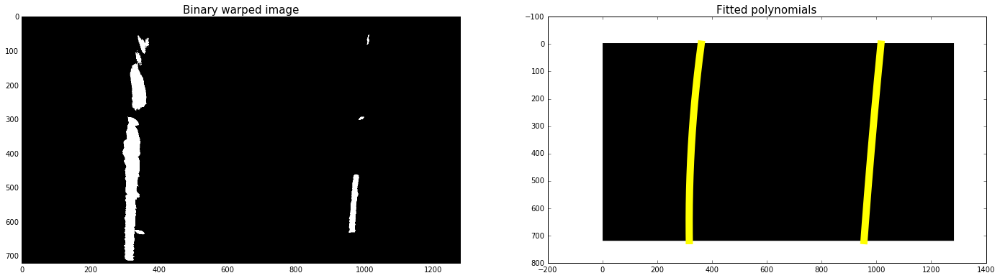

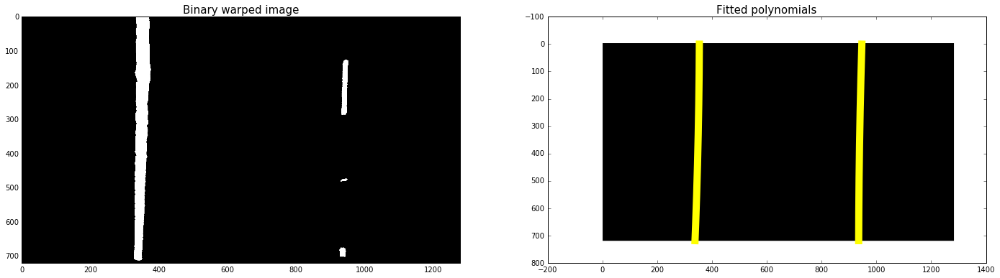

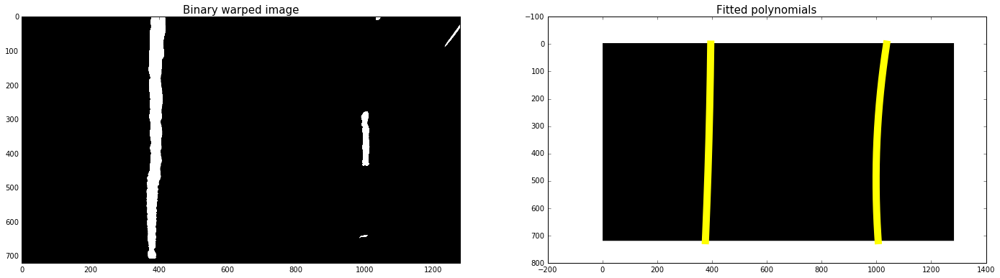

In [67]:
for i , image in enumerate(binary_warped) :
    out_img = np.zeros_like(warped_img)
    left_fitx , right_fitx , ploty ,_,_,_,_ = fit_polynomial(image)
    out_img = np.dstack((image,image,image))*0
    # Plots the left and right polynomials on the lane lines
    
    f , (ax1,ax2) = plt.subplots(1,2,figsize=(24,9))
    ax1.imshow(image ,  cmap='gray')
    ax1.set_title('Binary warped image' , fontsize=15)
    ax2.imshow(out_img)
    ax2.set_title('Fitted polynomials' , fontsize=15)
    
    # Plots the left and right polynomials on the lane lines
    
    ax2.plot(left_fitx, ploty, color='yellow' , linewidth = 10)
    ax2.plot(right_fitx, ploty, color='yellow', linewidth = 10)
    
    f.savefig('output_images/fitted_lines/'+str(i+1)+'.png')

# ( Measuring radius of curvature ) :

In [123]:
 def measure_curvature_real(linex , liney , y_val , ym_per_pix = 25/720 , xm_per_pix = 3.7/600):
        
        # Define conversions in x and y from pixels space to meters
        #ym_per_pix = 30/720 # meters per pixel in y dimension
        #xm_per_pix = 3.7/700 # meters per pixel in x dimension
        #####Implement the calculation of R_curve (radius of curvature) #####
        
        y_val = y_val * ym_per_pix
        
        fit = np.polyfit ( liney * ym_per_pix , linex * xm_per_pix , 2 )
        
        radius = ((np.power(1+np.square(2 * fit[0] * y_val + fit[1] ) , 3/2 ) ) /(np.absolute(2*fit[0]))) 
        
        return radius

# ( Measuring vehicle position ) :

In [124]:
def measure_vehicle_position( width , leftx , lefty , rightx , righty , y_val , ym_per_pix = 25/720 , xm_per_pix = 3.7/600) :

        # calculate the vehicle center in meters 
        # assuming the front-facing camera is mounted at the center of the vehicle

        vehicle_center = width//2 * xm_per_pix 
        
        right_fit = np.polyfit( righty , rightx , 2)
        left_fit  = np.polyfit( lefty  , leftx  , 2)

        # calculate x value for the right lane line at the bottom of the image in pixels space

        x_r = right_fit[0]*y_val**2 + right_fit[1] * y_val + right_fit[2]

        # calculate x value for the left lane line at the bottom of the image in pixels space

        x_l = left_fit[0] *y_val**2 + left_fit[1]  * y_val + left_fit[2]

        lane_center = ( (x_r + x_l) / 2 ) *xm_per_pix

        # calculate the distance of the vehicle from the lane center

        offset = vehicle_center - lane_center

        return offset


# The complete pipeline

In [88]:
# restore camera calibration results

infile = open('camera_calibration' , 'rb')
camera_data = pickle.load(infile)
infile.close()

camera_matrix = camera_data['camera_matrix']
distortion_coefficients = camera_data['distortion_coefficients']


h ,  w = test_images[1].shape[:2]
    
# calculte Minv for unwarping the images 
    
src_bottom_left = (0.5*w - 430 , h - 1)
src_top_left    = (0.5*w - 90  , 0.5*h + 120)
src_top_right   = (0.5*w + 90  , 0.5*h + 120)
src_bottom_right= (0.5*w + 470 , h - 1)

src_pts = np.array([src_bottom_left,src_top_left,src_top_right,src_bottom_right] , np.float32)


dst_bottom_left = (0.5*w - 300 , h - 1)
dst_top_left    = (0.5*w - 300 , 1)
dst_top_right   = (0.5*w + 300 , 1)
dst_bottom_right= (0.5*w + 300 , h - 1)

dst_pts = np.array([dst_bottom_left,dst_top_left,dst_top_right,dst_bottom_right] , np.float32)
                   
matrix_inv = cv2.getPerspectiveTransform( dst_pts , src_pts)

In [127]:
# put the preceding steps all together

def lane_finding(image , Minv = matrix_inv) :
    
    undist_image = undistort_image( image , camera_matrix , distortion_coefficients )
    
    warped_image = perspective_transform( undist_image )
    
    binary_warped = image_threshold( warped_image , l_thresh=(220,255) , b_thresh=(150,255) ) 
    
    left_fitx , right_fitx , ploty , leftx , lefty , rightx , righty = fit_polynomial(binary_warped)
    
    # Create an blank image to draw the lines on
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    
    result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)
    
    
    return result

# Test on images

		Original image				Final images


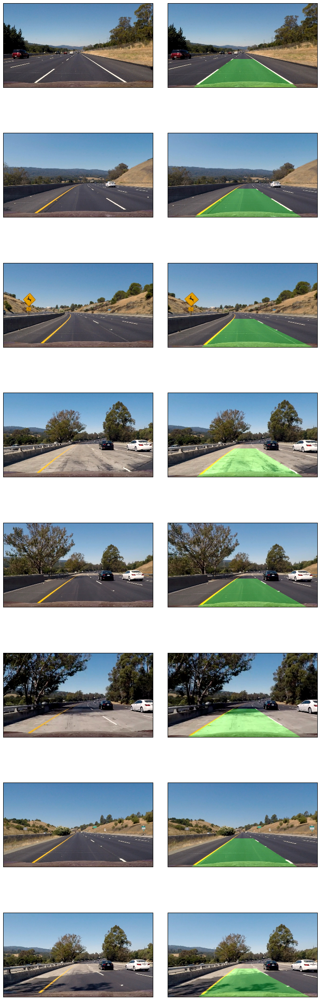

In [129]:
# apply lane_finding() function to test images and store the results in a list 

final_images = [lane_finding(image) for image in test_images]

# prepare the images for plotting

l = list(zip(test_images, final_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tFinal images')
show_images(combined , figure_save=True)

# save each final image in output_images/final_images/non_measured directory

for i , image in enumerate(final_images) :
    plt.imsave('output_images/final_images/non_measured/'+str(i+1)+'.png' , image)

Modification of lane_finding() function so that it displays some measurements on the lane boundaries-detected image such as radius of curvature and vehicle offset 

In [130]:
# put the preceding steps all together

def lane_finding(image , Minv = matrix_inv) :
    
    undist_image = undistort_image( image , camera_matrix , distortion_coefficients )
    
    warped_image = perspective_transform( undist_image )
    
    binary_warped = image_threshold( warped_image , l_thresh=(220,255) , b_thresh=(150,255) ) 
    
    left_fitx , right_fitx , ploty , leftx , lefty , rightx , righty = fit_polynomial(binary_warped)
    
    # Create an blank image to draw the lines on
    
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    
    result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)
    
    # printing radius of curavture and vehicle position
    
    # measuring radius of curvature
    
    y_val = np.max(ploty)
    
    radius = measure_curvature_real(leftx , lefty , y_val)
    text = "Radius of curvature : " + "{0:.3f}".format(radius)
    cv2.putText( result , text , (100,100) , cv2.FONT_HERSHEY_SIMPLEX , 1 , (255,255,255) , 2 , cv2.LINE_AA)

    #measuring distance of the vehicle from the lane center rounded to 3 decimal numbers

    distance = measure_vehicle_position(image.shape[1] , leftx , lefty , rightx , righty ,  y_val)
    label = "right" if distance > 0  else  "left" 
    text = "Vehicle is " + "{0:.3f}".format(np.abs(distance)) + " m " +label + " to lane center"
    cv2.putText( result , text , (100,150) , cv2.FONT_HERSHEY_SIMPLEX , 1 , (255,255,255) , 2 , cv2.LINE_AA)
    
    
    
    return result

		Original image				Final images


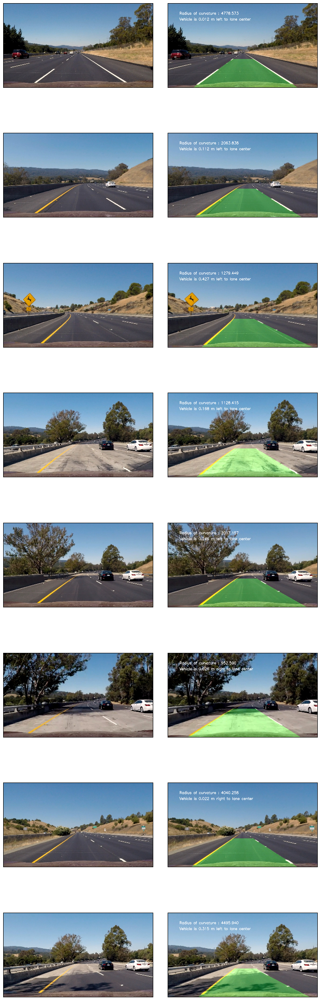

In [132]:
# apply lane_finding() function to test images and store the results in a list 

final_images = [lane_finding(image) for image in test_images]

# prepare the images for plotting

l = list(zip(test_images, final_images))
combined = [image for sublist in l for image in sublist ]
print('\t\tOriginal image\t\t\t\tFinal images')
show_images(combined , figure_save=True)

# save each final image in output_images/final_images/measured directory

for i , image in enumerate(final_images) :
    plt.imsave('output_images/final_images/measured/'+str(i+1)+'.png' , image)

# --------------------------------------------------------------------------------------------------------#

# Test on videos

import the needed libraries to read , edit and save videos

In [108]:
# Import everything needed to edit/save/watch video clips

from moviepy.editor import VideoFileClip 
from IPython.display import HTML

# Object-oriented programming

## 1 . Line class 

First ,  I've defined a `line` class to receive the characteristics of each line detection

In [109]:
from collections import deque

class Line:
    
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations - ndarray
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = np.array([False])
        #polynomial coefficients for the last n iterations fit  - Fixed length buffer to computer the mean over last n iterations
        self.poly_fit = deque( maxlen = 5) 
        #radius of curvature of the line in some units - Fixed length buffer to computer the mean over last n iterations
        self.radius = None
        self.radius_of_curvature = deque(maxlen = 5) 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  
        
    
    def is_pixels_found(self) :
        '''
        This method check if the pixels of the line are found 
        '''
        
        return (self.allx.size != 0 ) and (self.ally.size != 0)
#--------------------------------------------------------------------------------------------------------#        
    
    def measure_curvature_real(self , y_val , ym_per_pix = 30/720 , xm_per_pix = 3.7/700):
        
        # Define conversions in x and y from pixels space to meters
        #ym_per_pix = 30/720 # meters per pixel in y dimension
        #xm_per_pix = 3.7/700 # meters per pixel in x dimension
        #####Implement the calculation of R_curve (radius of curvature) #####
        
        y_val = y_val * ym_per_pix
        
        fit = np.polyfit ( self.ally * ym_per_pix , self.allx * xm_per_pix , 2 )
        
        self.radius = ((np.power(1+np.square(2 * fit[0] * y_val + fit[1] ) , 3/2 ) )  \
                       /(np.absolute(2*fit[0]))) 
        
        return self.radius
    
#--------------------------------------------------------------------------------------------------------#        
    
    def measure_curvature_pixels(self , y_val=719):
        
        #####Implement the calculation of R_curve (radius of curvature) #####
        radius = ((np.power(1+np.square(2*self.current_fit[0]*y_val + self.current_fit[1]),3/2)) \
                       /(np.absolute(2*self.current_fit[0]))) 
        return radius
    
#--------------------------------------------------------------------------------------------------------#
    
    def add_curvature_real( self) : 

        
        self.radius_of_curvature.append(self.radius)

#--------------------------------------------------------------------------------------------------------#
        
    def calculate_average_curvature_real (self) :

        mean_R = np.mean(self.radius_of_curvature , axis=None)
        return mean_R

#--------------------------------------------------------------------------------------------------------#
    
    def add_poly_fit( self) :
        '''
        This method adds the current polynomial coefficients to the cofficients of the last n iterations
        '''
        self.poly_fit.append(self.current_fit)

#--------------------------------------------------------------------------------------------------------#
    
    def calculate_average_fit(self) :
        '''
        This method calculate the polynomial coefficients averaged over the last n iterations
        '''
        self.best_fit = np.mean(self.poly_fit , axis=0) 

#--------------------------------------------------------------------------------------------------------#
    def is_fit_buffer_empty(self) :
        
        '''
        This method checks if the buffer that holds polynomial coefficients of the last n iterations is empty or not
        '''
        return bool(not len(self.poly_fit))

## 2 . Lane detector class :

second , I've created a `lane_detector` class which incorporates all the steps needed to detect lane lines .

## Helper functions :

Let's define some helper functions which will be used to find right and left lane lines pixels in a binary warped image 

In [110]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    #out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 75
    # Set minimum number of pixels found to recenter window
    minpix = 30

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low   = leftx_current  - margin  # Update this
        win_xleft_high  = leftx_current  + margin  # Update this
        win_xright_low  = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        # uncomment this to draw sliding windows on Test images
        
        # Draw the windows on the visualization image
        #cv2.rectangle( out_img , (win_xleft_low,win_y_low)  , (win_xleft_high,win_y_high)  , (0,255,0) , 2) 
        #cv2.rectangle( out_img , (win_xright_low,win_y_low) , (win_xright_high,win_y_high) , (0,255,0) , 2) 
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty


#---------------------------------------------------------------------------------------------------#


def look_ahead_filter(binary_warped , left_fit , right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###

    ploty = np.linspace(0 , binary_warped.shape[0]-1 , binary_warped.shape[0])
    
    left_lane_inds =  ( ( nonzerox > ( left_fit[0] * ( nonzeroy**2 ) + (left_fit[1] * nonzeroy) + 
                        left_fit[2] - margin ) ) & ( nonzerox < ( left_fit[0] * ( nonzeroy**2 ) +  
                        ( left_fit[1] * nonzeroy ) + left_fit[2]  + margin ) ) )
    
    right_lane_inds = ( ( nonzerox > ( right_fit[0]* ( nonzeroy**2 ) + (right_fit[1]* nonzeroy) +  
                        right_fit[2] - margin) ) & ( nonzerox < ( right_fit[0]* ( nonzeroy**2 ) +  
                        ( right_fit[1]* nonzeroy ) + right_fit[2] + margin ) ) )
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx , lefty , rightx , righty
    


## Lane_detector class :

In [116]:
class Lane_detector :
    
    def __init__ (self , img_size=(720,1280) ) :
        
        self.number_frames = 0
        self.pixels_found = 0
        self.pixels_found_good_detection = 0
        self.pixels_found_bad_detection = 0
        self.pixels_not_found = 0
        
        self.camera_matrix = None
        self.distortion_coefficients = None 
        
        self.height = img_size[0]
        self.width = img_size[1]
        
        # order -> top_left , bottom_left , bottom_right , top_right
        
        '''
        self.src_pts = np.array([
                                     [ 0.5*self.width - 430 , self.height - 1 ]       ,  \
                                     [ 0.5*self.width - 90  , 0.5*self.height + 120 ] ,  \
                                     [ 0.5*self.width + 90  , 0.5*self.height + 120 ] ,  \
                                     [ 0.5*self.width + 470 , self.height - 1 ]          \
                                
                                ] , np.float32)
        
        self.dst_pts = np.array([    
                                     [ 0.5*self.width - 300 , self.height - 1 ]       ,  \
                                     [ 0.5*self.width - 300 , 1 ]                     ,  \
                                     [ 0.5*self.width + 300 , 1 ]                     ,  \
                                     [ 0.5*self.width + 300 , self.height - 1]           \
                                
                                ], np.float32)
        
        '''
    
        self.src_pts = np.array( [ [ 585 , 460 ] , [ 203 , 720 ] , [ 1126 , 720 ] , [ 695 , 460 ] ] , dtype=np.float32)
        self.dst_pts = np.array( [ [ 320 , 0 ]   , [ 320 , 720 ] , [ 960 , 720 ]  , [ 960 , 0 ] ]   , dtype=np.float32)

        self.M = cv2.getPerspectiveTransform( self.src_pts , self.dst_pts)
        self.Minv = cv2.getPerspectiveTransform( self.dst_pts , self.src_pts)
        
        # Instantiate right and left line objects as memebr in lane_detector class
        
        self.right = Line()
        self.left  = Line()
        
        # create y values vector for plotting
        
        self.ploty = np.linspace(0 , self.height - 1 , self.height )
        
        self.y_val = np.max(self.ploty)
        
        # conversions in x and y from pixels space to meters
        
        self.ym_per_pix = 23/720   # meters per pixel in y dimension
        self.xm_per_pix = 3.7/600  # meters per pixel in x dimension
        
        # counter that counts the droped frames "bad or difficult frames"
        # give it some big value as default value ! to force the slidwing windows to be always used
        # for the first time. 
        
        self.counter = 20  
        
        # the threshold of number of droped frames after which switch to sliding windows again
        
        self.frames_threshold = 8
        
        

#--------------------------------------------------------------------------------------------------------#

    def calibrate_camera(self , chessBoards_path , pattern=(9,6)) :
        
        nx = pattern[0]  # number of inside corners in x
        ny = pattern[1]  # number of inside corners in y
    
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)

        objp = np.zeros((nx*ny,3), np.float32)
        objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

        # Arrays to store object points and image points from all the images.
        
        objpoints = [] # 3d points in real world space
        imgpoints = [] # 2d points in image plane.


        # Step through the list and search for chessboard corners

        for img_path in glob.glob(chessBoards_path+'/*.jpg'):
        
            img = cv2.imread(img_path)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

            # If found, add object points, image points
            if ret == True:
               
                objpoints.append(objp)
                imgpoints.append(corners)
        
        # perform camera calibration
        ret , mtx , dist , rvecs , tvecs = cv2.calibrateCamera(objpoints , imgpoints , gray.shape[::-1] ,None , None)
    
        if ret != True :
            
            self.camera_matrix = mtx
            self.distortion_coefficients = dist
        
        else :
            
            raise ValueError('Camera calibration failed !')
        
        
#--------------------------------------------------------------------------------------------------------#      
        
    def load_calibration(self , pickleFile_path) :
    
        infile = open(pickleFile_path , 'rb')
        camera_data = pickle.load(infile)
        infile.close()

        self.camera_matrix = camera_data['camera_matrix']
        self.distortion_coefficients = camera_data['distortion_coefficients']

#--------------------------------------------------------------------------------------------------------#
        
    def set_srcPts(self , src_pts) :  
        
        self.src_pts = np.array(src_pts , dtype=np.float32)
    
#--------------------------------------------------------------------------------------------------------#
        
    def set_dstPts(self , dst_pts) :  
        
        self.dst_pts = np.array(dst_pts , dtype=np.float32)
        
#--------------------------------------------------------------------------------------------------------#

    def draw_srcPts(self , image) :
        
        img = np.copy(image)
        
        # recast src_pts into usable format for cv2.polylines

        src_pts = self.src_pts.astype(np.int32).reshape((-1,1,2)) 
        
        cv2.polylines(img , [src_pts] , True , (0,255,0), thickness=10)
    
#--------------------------------------------------------------------------------------------------------#

    def draw_dstPts(self , image) :
        
        h , w = image.shape[:2]
        
        # recast src_pts and dst_pts into usable format for cv2.polylines

        src_pts = self.src_pts.astype(np.int32).reshape((-1,1,2))
        dst_pts = self.dst_pts.astype(np.int32).reshape((-1,1,2))
        
        # Given source points and destination points calculate the transformation matrix M
        M = cv2.getPerspectiveTransform(src_pts, dst_pts)
        # Warp the image
        warped_image = cv2.warpPerspective(image , M , (w,h) )
    
        cv2.polylines(warped_img , [dst_pts] , True , (255,0,0), thickness=10)
        
#--------------------------------------------------------------------------------------------------------#

    def adjust_birdView(self , new_src_pts , new_dst_pts) :
    
        self.set_srcPts(new_src_pts)
        self.set_dstPts(new_dst_pts)

        self.M = cv2.getPerspectiveTransform(self.src_pts , self.dst_pts)
        self.Minv = cv2.getPerspectiveTransform(self.dst_pts , self.src_pts)

#--------------------------------------------------------------------------------------------------------#

    def birdView(self , image) :
    
        h , w = image.shape[:2]
        warped = cv2.warpPerspective(image , self.M , (w,h) )

        return warped

#--------------------------------------------------------------------------------------------------------#

    def image_threshold( self , image , l_thresh=(200,255) , b_thresh=(140,255)) :
    
        lab = cv2.cvtColor( image , cv2.COLOR_RGB2LAB)
        l_channel = lab[:,:,0]
        b_channel = lab[:,:,2]

        binary = np.zeros(image.shape[:2])
        binary[((l_channel>l_thresh[0]) & (l_channel<=l_thresh[1])) | ((b_channel>b_thresh[0]) & (b_channel<=b_thresh[1]))] =1

        return binary

#--------------------------------------------------------------------------------------------------------#

    def undistort_image(self , image):
     
        undist = cv2.undistort(image , self.camera_matrix , self.distortion_coefficients , None , self.camera_matrix )

        return undist
    
#--------------------------------------------------------------------------------------------------------#

    def set_xScale(self , xm_per_pix ) :
        
        self.xm_per_pix = xm_per_pix
        
#--------------------------------------------------------------------------------------------------------#

    def set_yScale(self , ym_per_pix ) :
        
        self.ym_per_pix = ym_per_pix
        
#--------------------------------------------------------------------------------------------------------#

    def sanity_check( self , candidateFit_right , candidateFit_left) :
        '''
        This method performs "sanity check" between detected right and left lines though their coefficients
        and if they have similar curvature , roughly parallel , are separated by approximately 
        the right distance horizontally , then the detection makes sense .
        '''
        bottom = self.height - 1
        
        parallel = ( np.abs (candidateFit_right[0] - candidateFit_left[0]) < 1 ) and \
                   ( np.abs (candidateFit_right[1] - candidateFit_left[1]) < 1 )
            
        r1 = ((np.power(1+np.square(2*candidateFit_right[0]*self.y_val + candidateFit_right[1]),3/2)) 
                       /(np.absolute(2*candidateFit_right[0])))
        
        r2 = ((np.power(1+np.square(2*candidateFit_left[0]*self.y_val + candidateFit_left[1]),3/2)) 
                       /(np.absolute(2*candidateFit_left[0])))

        similar_curvature = np.abs(r1 - r2 ) < 40000
        
        x1 = candidateFit_right[0]*bottom**2 + candidateFit_right[1]*bottom + candidateFit_right[2]
        x2 = candidateFit_left [0]*bottom**2 + candidateFit_left [1]*bottom + candidateFit_left [2]
        
        distance = np.abs(x1 - x2) < 700
        
        flag = parallel and similar_curvature and distance
        return flag
    
#--------------------------------------------------------------------------------------------------------#

    def sanity_check2(self , candidateFit_right , candidateFit_left ,  minSlope, maxSlope):
        #Performs a sanity check on the lanes
        #Check 1: check if left and right fits exists
        #Check 2: Calculates the tangent between left and right in two points, and check if it is in a reasonable threshold

        if len(candidateFit_right) ==0 or len(candidateFit_left) == 0:

            status = False

        else:

            #Difference of slope
            L_0 = 2 * candidateFit_left[0] * (self.height/2+100) + candidateFit_left[1]
            R_0 = 2 * candidateFit_right[0]* (self.height/2+100) + candidateFit_right[1]
            d0 =  np.abs(L_0-R_0)

            L_1 = 2 * candidateFit_left[0] * (self.height - 1)  + candidateFit_left[1]
            R_1 = 2 * candidateFit_right[0] * (self.height - 1) + candidateFit_right[1]
            d1 =  np.abs(L_1-R_1)


            if d0>= minSlope and d0<= maxSlope and d1>= minSlope and d1<= maxSlope:

                status = True

            else:

                status = False

        return status

#--------------------------------------------------------------------------------------------------------#

    def process(self , image ) :
        
        # image preprocessing
        self.number_frames = self.number_frames + 1
    
        undist_image  = self.undistort_image( image )

        warped_image  = self.birdView( undist_image )

        binary_warped = self.image_threshold( warped_image ) 

        # find lane pixels using sliding windows 
        
        # if number of droped frames is greater than frames_threshold , use slidwing windows 
        # to re-establish your measurements 
        # Note : it's initialized to some bigger number than frames_threshold to force using it for the first time
        
        if self.counter > self.frames_threshold :
            
            self.left.allx , self.left.ally , self.right.allx , self.right.ally = find_lane_pixels(binary_warped)
        
        # if numer of droped frames is smaller than frames_threshold ,  use look ahead filter
        
        else :
            
            self.left.allx , self.left.ally , self.right.allx , self.right.ally = look_ahead_filter(
            binary_warped , self.left.current_fit , self.right.current_fit)
            
        # if lane pixels are found 
        
        if self.left.is_pixels_found()  and self.right.is_pixels_found() :
            self.pixels_found = self.pixels_found + 1
            # fit a second order polynomial to each using `np.polyfit` #
            
            new_fit_right = np.polyfit( self.right.ally , self.right.allx , 2 )
            new_fit_left  = np.polyfit( self.left.ally  , self.left.allx  , 2 )
            
            # perform sanity check on detected lines 

            if self.sanity_check2( new_fit_right , new_fit_left , 0 , 0.55) == True :
                
                # if this detection makes sense i.e , "good measurement"
                self.pixels_found_good_detection = self.pixels_found_good_detection + 1
                # update features

                self.right.detected = True                        # mark as detected
                self.left.detected = True                         # mark as detected

                self.right.current_fit = new_fit_right
                self.left.current_fit = new_fit_left
                
                # add the current 2nd order polynomial coefficients to the buffer 
                # that holds the cofficients of the last n good iterations
                
                self.right.add_poly_fit()
                self.left.add_poly_fit()

                # reset the number of droped frames to zero

                self.counter = 0

                # Generate x values for plotting

                if self.right.is_fit_buffer_empty() and self.left.is_fit_buffer_empty() :
                 
                # if buffer is empty , use the current_fit
                    try:

                        self.right.bestx = self.right.current_fit[0]*self.ploty**2  \
                                        + self.right.current_fit[1]*self.ploty  \
                                        + self.right.current_fit[2]

                        self.left.bestx  = self.left.current_fit[0]*self.ploty**2   \
                                        + self.left.current_fit[1]*self.ploty   \
                                        + self.left.current_fit[2]

                    except TypeError:

                        # Avoids an error if `left` and `right_fit` are still none or incorrect
                        self.right.bestx = 1*self.ploty**2 + 1*self.ploty
                        self.left.bestx  = 1*self.ploty**2 + 1*self.ploty
                        
                # if buffer has some values then average them and use the result for plotting
                
                else :
                    
                    self.right.calculate_average_fit()
                    self.left.calculate_average_fit()
                    
                    try:

                        self.right.bestx = self.right.best_fit[0]*self.ploty**2  \
                                        + self.right.best_fit[1]*self.ploty  \
                                        + self.right.best_fit[2]

                        self.left.bestx  = self.left.best_fit[0]*self.ploty**2   \
                                        + self.left.best_fit[1]*self.ploty   \
                                        + self.left.best_fit[2]

                    except TypeError:

                        # Avoids an error if `left` and `right_fit` are still none or incorrect
                        self.right.bestx = 1*self.ploty**2 + 1*self.ploty
                        self.left.bestx  = 1*self.ploty**2 + 1*self.ploty

                
        #---------------------------------Visualization------------------------------------#
                
                # Create an blank image to draw the lines on

                warp_zero = np.zeros_like(binary_warped).astype(np.uint8)

                color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

                # Recast the x and y points into usable format for cv2.fillPoly()

                pts_right = np.array([np.flipud(np.transpose(np.vstack([self.right.bestx, self.ploty])))])

                pts_left = np.array([np.transpose(np.vstack([self.left.bestx, self.ploty]))])

                pts = np.hstack((pts_left, pts_right))

                # Draw the lane onto the warped blank image

                cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

                # Warp the blank back to original image space using inverse perspective matrix (Minv)

                newwarp = cv2.warpPerspective(color_warp, self.Minv, (self.width, self.height)) 

                # Combine the result with the original image

                result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)

                # print some measurments onto the result image
                
                result[0:360,960:1280,:] = cv2.resize(np.dstack((binary_warped , binary_warped , binary_warped))*255,(320,360))

                # radius of curvature 

                radius = int(self.left.measure_curvature_real(self.y_val))
                text = "Radius of curvature : " + str(radius)
                cv2.putText( result , text , (100,100) , cv2.FONT_HERSHEY_SIMPLEX , 1 , (255,255,255) , 2 , cv2.LINE_AA)

                # distance of the vehicle from the lane center rounded to 3 decimal numbers

                distance = self.vehicle_position()
                label = "right" if distance > 0  else  "left" 
                text = "Vehicle is " + "{0:.3f}".format(np.abs(distance)) + " m " +label + " to lane center"
                cv2.putText( result , text , (100,150) , cv2.FONT_HERSHEY_SIMPLEX , 1 , (255,255,255) , 2 , cv2.LINE_AA)

                return result      
            
                #------------------------------------------------------------------------#
                
            # if it's a bad detection that doesn't make sense
            
            else :
            
                self.pixels_found_bad_detection = self.pixels_found_bad_detection + 1
                self.right.detected = False          # mark as undetected
                self.left.detected = False           # mark as undetected
                
            # increase the number of droped frames by one    
                
                self.counter = self.counter + 1
                
            # don't update features such as current_fit to search again 
            # using information from the previous frame
            
            # skip this frame 
            
                # if the buffer is empty , do nothing
                
                if  self.right.is_fit_buffer_empty() and self.left.is_fit_buffer_empty() :
                    
                    return image
                
                # if it's not empty , take the average of the last n iterations and plot it 
                
                else :
                    
                    self.right.calculate_average_fit()
                    self.left.calculate_average_fit()
                
                    # Generate x values for plotting

                    try:

                        self.right.bestx = self.right.best_fit[0]*self.ploty**2  \
                                    + self.right.best_fit[1]*self.ploty  \
                                    + self.right.best_fit[2]

                        self.left.bestx  = self.left.best_fit[0]*self.ploty**2   \
                                    + self.left.best_fit[1]*self.ploty   \
                                    + self.left.best_fit[2]

                    except TypeError:

                    # Avoids an error if `left` and `right_fit` are still none or incorrect
                        self.right.bestx = 1*self.ploty**2 + 1*self.ploty
                        self.left.bestx  = 1*self.ploty**2 + 1*self.ploty
                        
                    # Create an blank image to draw the lines on

                    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)

                    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

                    # Recast the x and y points into usable format for cv2.fillPoly()

                    pts_right = np.array([np.flipud(np.transpose(np.vstack([self.right.bestx, self.ploty])))])

                    pts_left = np.array([np.transpose(np.vstack([self.left.bestx, self.ploty]))])

                    pts = np.hstack((pts_left, pts_right))

                    # Draw the lane onto the warped blank image

                    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

                    # Warp the blank back to original image space using inverse perspective matrix (Minv)

                    newwarp = cv2.warpPerspective(color_warp, self.Minv, (self.width, self.height)) 

                    # Combine the result with the original image

                    result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)

                    # print some measurments onto the result image
                    
                    result[0:360,960:1280,:] = cv2.resize(np.dstack((binary_warped , binary_warped , binary_warped))*255,(320,360))                    # radius of curvature 

                    
                    return result       

            
        # # if lane pixels are not found ! 
            
        else :
            
            self.pixels_not_found = self.pixels_not_found + 1
            self.right.detected = False          # mark as undetected
            self.left.detected = False           # mark as undetected

            # increase the number of droped frames by one    

            self.counter = self.counter + 1

            # don't update features such as current_fit to search again 
            # using information from the previous frame

            # skip this frame and do nothing !

            if  self.right.is_fit_buffer_empty() and self.left.is_fit_buffer_empty() :
                    
                    return image
                
                # if it's not empty , take the average of the last n iterations and plot it 
                
            else :
                    
                self.right.calculate_average_fit()
                self.left.calculate_average_fit()
                
                # Generate x values for plotting

                try:

                    self.right.bestx = self.right.best_fit[0]*self.ploty**2  \
                                    + self.right.best_fit[1]*self.ploty  \
                                    + self.right.best_fit[2]

                    self.left.bestx  = self.left.best_fit[0]*self.ploty**2   \
                                    + self.left.best_fit[1]*self.ploty   \
                                    + self.left.best_fit[2]

                except TypeError:

                    # Avoids an error if `left` and `right_fit` are still none or incorrect
                    self.right.bestx = 1*self.ploty**2 + 1*self.ploty
                    self.left.bestx  = 1*self.ploty**2 + 1*self.ploty
                        
                # Create an blank image to draw the lines on

                warp_zero = np.zeros_like(binary_warped).astype(np.uint8)

                color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

                # Recast the x and y points into usable format for cv2.fillPoly()

                pts_right = np.array([np.flipud(np.transpose(np.vstack([self.right.bestx, self.ploty])))])

                pts_left = np.array([np.transpose(np.vstack([self.left.bestx, self.ploty]))])

                pts = np.hstack((pts_left, pts_right))

                # Draw the lane onto the warped blank image

                cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

                # Warp the blank back to original image space using inverse perspective matrix (Minv)

                newwarp = cv2.warpPerspective(color_warp, self.Minv, (self.width, self.height)) 

                # Combine the result with the original image

                result = cv2.addWeighted(undist_image, 1, newwarp, 0.3, 0)
                result[0:360,960:1280,:] = cv2.resize(np.dstack((binary_warped , binary_warped , binary_warped))*255,(320,360))            
                return result

        
    
        
    
        
        
        
    
#--------------------------------------------------------------------------------------------------------#

    def visualize_lanePixels(self , binary_warped) :
                
        # Take a histogram of the bottom half of the image
        
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        
        # Create an output image to draw on and visualize the result
        
        out_img = np.dstack( ( binary_warped , binary_warped , binary_warped ) ).astype(np.uint8)
        
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        
        midpoint = np.int(histogram.shape[0]//2)
        
        leftx_base = np.argmax(histogram[:midpoint])
        
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # HYPERPARAMETERS
        # Choose the number of sliding windows
        
        nwindows = 9
        
        # Set the width of the windows +/- margin
        
        margin = 100
        
        # Set minimum number of pixels found to recenter window
        
        minpix = 50
        
        # Set height of windows - based on nwindows above and image shape
        
        window_height = np.int(binary_warped.shape[0]//nwindows)
        
        # Identify the x and y positions of all nonzero pixels in the image
        
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        # Current positions to be updated later for each window in nwindows
        
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        # Create empty lists to receive left and right lane pixel indices
        
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            ### TO-DO: Find the four below boundaries of the window ###
            win_xleft_low   = leftx_current  - margin  # Update this
            win_xleft_high  = leftx_current  + margin  # Update this
            win_xright_low  = rightx_current - margin  # Update this
            win_xright_high = rightx_current + margin  # Update this

            # Draw the windows on the visualization image
            
            cv2.rectangle(out_img,(win_xleft_low,win_y_low)  , (win_xleft_high,win_y_high) , (0,255,0) , 2) 
            
            cv2.rectangle(out_img,(win_xright_low,win_y_low) , (win_xright_high,win_y_high), (0,255,0) , 2) 

            ### Identify the nonzero pixels in x and y within the window ###
            
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &  
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &  
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            ### If you found > minpix pixels, recenter next window ###
            ### (`right` or `leftx_current`) on their mean position ###
            
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        # Colors in the left and right lane regions
    
        out_img[ lefty , leftx ] = [255, 0 , 0]
        
        out_img[ righty, rightx] = [0, 0, 255]
        
        # return the result
        
        return out_img 

#--------------------------------------------------------------------------------------------------------#

    def visualize_fittedLines( self , binary_image) :
        
        # Find our lane pixels first
        
        leftx, lefty, rightx, righty  = find_lane_pixels(binary_warped)

        ### Fit a second order polynomial to each using `np.polyfit` ###
    
        left_fit  = np.polyfit( lefty , leftx , 2 )
        right_fit = np.polyfit( righty , rightx , 2 )

        # Generate x and y values for plotting
        
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        
        try:
            
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        except TypeError:
            
            # Avoids an error if `left` and `right_fit` are still none or incorrect
        
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        ## Visualization ##
        # Colors in the left and right lane regions
        
        out_img = np.dstack((binary_warped , binary_warped , binary_warped))
        
        out_img[lefty , leftx ] = [255, 0, 0]
        out_img[righty, rightx] = [0, 0, 255]

        # Plots the left and right polynomials on the lane lines
        
        plt.imshow(out_img)
        plt.xlim( 0 , 1280 )
        plt.ylim( 0 , 720 )
        plt.plot( left_fitx[::-1]  , ploty , color='yellow' )
        plt.plot( right_fitx[::-1] , ploty , color='yellow')
        plt.gca().invert_yaxis() 
        plt.gca().invert_yaxis()                                 # to visualize as we do the images
        
#--------------------------------------------------------------------------------------------------------#

    def vehicle_position(self) :

        # calculate the vehicle center in meters 
        # assuming the front-facing camera is mounted at the center of the vehicle

        vehicle_center = self.width//2 * self.xm_per_pix 

        bottom = self.height - 1          # y value at the bottom of the image

        # calculate x value for the right lane line at the bottom of the image in pixels space

        x_r = self.right.current_fit[0]*bottom**2 + self.right.current_fit[1] * bottom + self.right.current_fit[2]

        # calculate x value for the left lane line at the bottom of the image in pixels space

        x_l = self.left.current_fit[0] *bottom**2 + self.left.current_fit[1]  * bottom + self.left.current_fit[2]

        lane_center = ( (x_r + x_l) / 2 ) * self.xm_per_pix

        # calculate the distance of the vehicle from the lane center

        offset = vehicle_center - lane_center

        return offset


# Test on images

Instantiate an object from `Lane_detector` class

In [54]:
Detector = Lane_detector() 
Detector.calibrate_camera('camera_cal')

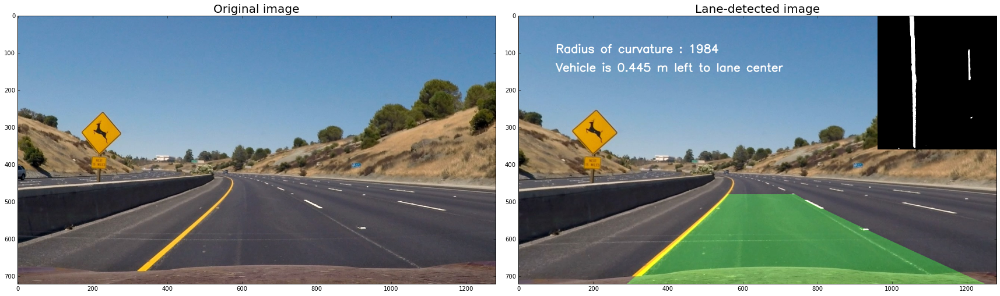

In [55]:
# select some image to test the pipeline on .

image = test_images[2]

# apply the pipeline to the image and get the result

final = Detector.process(image)

# visualize images

f , ( ax1 , ax2 ) = plt.subplots( 1 , 2 , figsize=(24,9) )

f.tight_layout()
ax1.imshow( image )
ax1.set_title('Original image' , fontsize=20 )
ax2.imshow( final )
ax2.set_title('Lane-detected image' , fontsize=20 )

# Test on videos 

Let's define a helper function that processes a video

In [112]:
def process_video(input_video , output_video) :
    '''
    This function takes in the path of the video to be processed then processes it 
    and writes a copy of it in the path defined by output_video
    '''
    # instantiate an object from the class
    
    Detector = Lane_detector()
    
    # Calibrate the detector
    
    Detector.calibrate_camera('camera_cal')

    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ##clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
    clip1 = VideoFileClip(input_video)
    output_clip = clip1.fl_image(Detector.process)             #NOTE: this function expects color images!!
    output_clip.write_videofile(output_video, audio=False)

## 1 . Project video

In [49]:
process_video("project_video.mp4" , "output_videos/project_video.mp4")

[MoviePy] >>>> Building video output_videos/project_video.mp4
[MoviePy] Writing video output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [03:25<00:00,  6.13it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/project_video.mp4 



## 2 . Challenge video

In [51]:
process_video("challenge_video.mp4" , "output_videos/challenge_video.mp4")

[MoviePy] >>>> Building video output_videos/challenge_video.mp4
[MoviePy] Writing video output_videos/challenge_video.mp4


100%|██████████| 485/485 [01:18<00:00,  6.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/challenge_video.mp4 



In [117]:
process_video("harder_challenge_video.mp4" , "output_videos/harder_challenge_video.mp4")

[MoviePy] >>>> Building video output_videos/harder_challenge_video.mp4
[MoviePy] Writing video output_videos/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [03:37<00:00,  5.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/harder_challenge_video.mp4 

